<u><b><h3>Data Description:</h3></b></u>
The data contains features extracted from the silhouette of vehicles in different
angles. Four "Corgie" model vehicles were used for the experiment: a double
decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This
particular combination of vehicles was chosen with the expectation that the
bus, van and either one of the cars would be readily distinguishable, but it
would be more difficult to distinguish between the cars.

<u><b><h3>Domain:</h3></b></u>
Object recognition

<u><b><h3>Context:</h3></b></u>
The purpose is to classify a given silhouette as one of three types of vehicle,
using a set of features extracted from the silhouette. The vehicle may be viewed
from one of many different angles.<br>
<u><b><h3>Attribute Information:</h3></b></u>
<ul><li> All the features are geometric features extracted from the silhouette.
<li> All are numeric in nature.</ul>

<u><b><h3>Objective:</h3></b></u>
Apply dimensionality reduction technique – PCA and train a model using
principle components instead of training the model using just the raw data.
    



<b>Importing Libraries

In [71]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import scipy.stats as stats
import numpy as np
from pandas.api.types import is_numeric_dtype
from statsmodels.stats.proportion import proportions_ztest
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.stats import gamma
from sklearn.preprocessing import StandardScaler
sns.set(color_codes=True)
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
%matplotlib inline


<b>Functions for EDA

In [69]:
def Distribution_Continous_Variables(series,color,title):
    plt.figure(figsize=(10, 5))
    sns.distplot(series, color = color).set_title(title)
    
def Print_Summary(series,title,var):
    print(title)
    print('Count = {1}'.format(var,len(series)))
    print('Mean of {0} = {1}'.format(var,series.mean()))
    print('Median of {0} = {1}'.format(var,series.median()))
    print('Mode of {0} = {1}'.format(var,series.mode().values[0]))
    print('Skewness of {0} = {1}'.format(var, series.skew()))
    print('Excess Kurtosis of {0} = {1}'.format(var,series.kurtosis()))
    print(100*"*")

def Coeff_Variation(series,title,var):
    print('CV of {0} for {1} = {2}'.format(var,title,(series.std()/series.mean())*100))

def BoxPlot(**kwargs):
    plt.figure(figsize=(10, 5))
    sns.boxplot(x = kwargs['x'], \
                y = kwargs['y'], \
                data = kwargs['data'], \
                color = kwargs['color'], \
                hue = kwargs['hue']).set_title(kwargs['title'])    

def ViolinPlot(**kwargs):
    plt.figure(figsize=(10, 5))
    sns.violinplot(x = kwargs['x'], \
                y = kwargs['y'], \
                data = kwargs['data'], \
                color = kwargs['color'], \
                hue = kwargs['hue']).set_title(kwargs['title']) 
    
        
def CountPlot(**kwargs):
    plt.figure(figsize=(10, 5))
    sns.countplot(y=kwargs['y'], \
                    hue=kwargs['hue'], \
                    data=kwargs['data']).set_title(kwargs['title'])

def calc_vif(X):

    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)


def backwardElimination(x, Y, significance_level, columns):
    numVars = len(x[0])
    for i in range(0, numVars):
        regressor_OLS = sm.OLS(Y, x).fit()
        maxVar = max(regressor_OLS.pvalues).astype(float)
        if maxVar > significance_level:
            for j in range(0, numVars - i):
                if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                    x = np.delete(x, j, 1)
                    columns = np.delete(columns, j)
                    
    regressor_OLS.summary()
    return x, columns
    
   

<b>Data Preprocessing

In [4]:
#---importing from csv into datframe---#
df = pd.read_csv("vehicle.csv")

In [5]:
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [7]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

<b>Observation:</b> All features except 'class' are continous in nature while class is categorical

<b>Find missing values

In [8]:
df.isnull().values.any()

True

In [9]:
df.isnull().any()

compactness                    False
circularity                     True
distance_circularity            True
radius_ratio                    True
pr.axis_aspect_ratio            True
max.length_aspect_ratio        False
scatter_ratio                   True
elongatedness                   True
pr.axis_rectangularity          True
max.length_rectangularity      False
scaled_variance                 True
scaled_variance.1               True
scaled_radius_of_gyration       True
scaled_radius_of_gyration.1     True
skewness_about                  True
skewness_about.1                True
skewness_about.2                True
hollows_ratio                  False
class                          False
dtype: bool

<b>Number of null values

In [10]:
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

<b>Imputing using median

In [11]:
#---Reference---#
#--https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779

In [12]:
imp_median = SimpleImputer( strategy='median') #for median imputation replace 'mean' with 'median'
imputed_df = pd.DataFrame(imp_median.fit_transform(df.loc[:, df.dtypes != np.object]))


In [13]:
imputed_df.columns = df.loc[:, df.dtypes != np.object].columns
imputed_df.index = df.loc[:, df.dtypes != np.object].index

In [14]:
imputed_df['class'] = df['class']

In [15]:
imputed_df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

<b>Imputation using KNN 

This method is sensitive to outliers

In [16]:
#!pip install impyute

In [17]:
import sys
from impyute.imputation.cs import fast_knn
sys.setrecursionlimit(100000) #Increase the recursion limit of the OS

# start the KNN training
imputed_knn =fast_knn(df.loc[:, df.dtypes != np.object].values, k=30)

In [18]:
impute_knn_df = pd.DataFrame(imputed_knn)
impute_knn_df.columns = df.loc[:, df.dtypes != np.object].columns
impute_knn_df.index = df.loc[:, df.dtypes != np.object].index
impute_knn_df['class'] = df['class']

In [19]:
impute_knn_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,van
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,van
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,car
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,van
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,bus


In [20]:
impute_knn_df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [21]:
print(df.shape)
print(imputed_df.shape)
print(impute_knn_df.shape)

(846, 19)
(846, 19)
(846, 19)


<b>Conclusion:</b> We have around 846 data points and 19 features in total. We have also applied different imputation strategies which we will check one by one

<b>BiVariate Analysis and Conclusion

Below we are using the dataset where empty values have been imputed by median

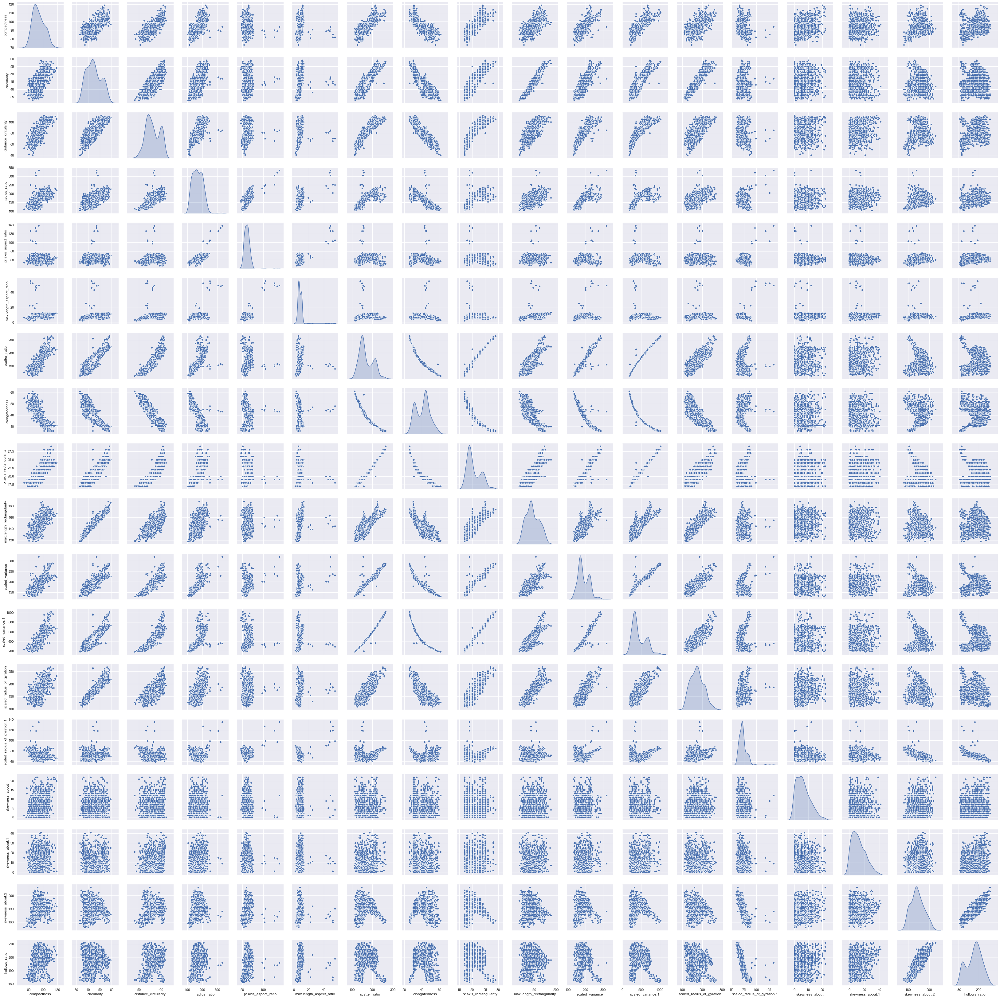

In [22]:
sns.pairplot(imputed_df, diag_kind='kde')
plt.show()

Below we are using the dataset where empty values have been imputed by values calculated by knn

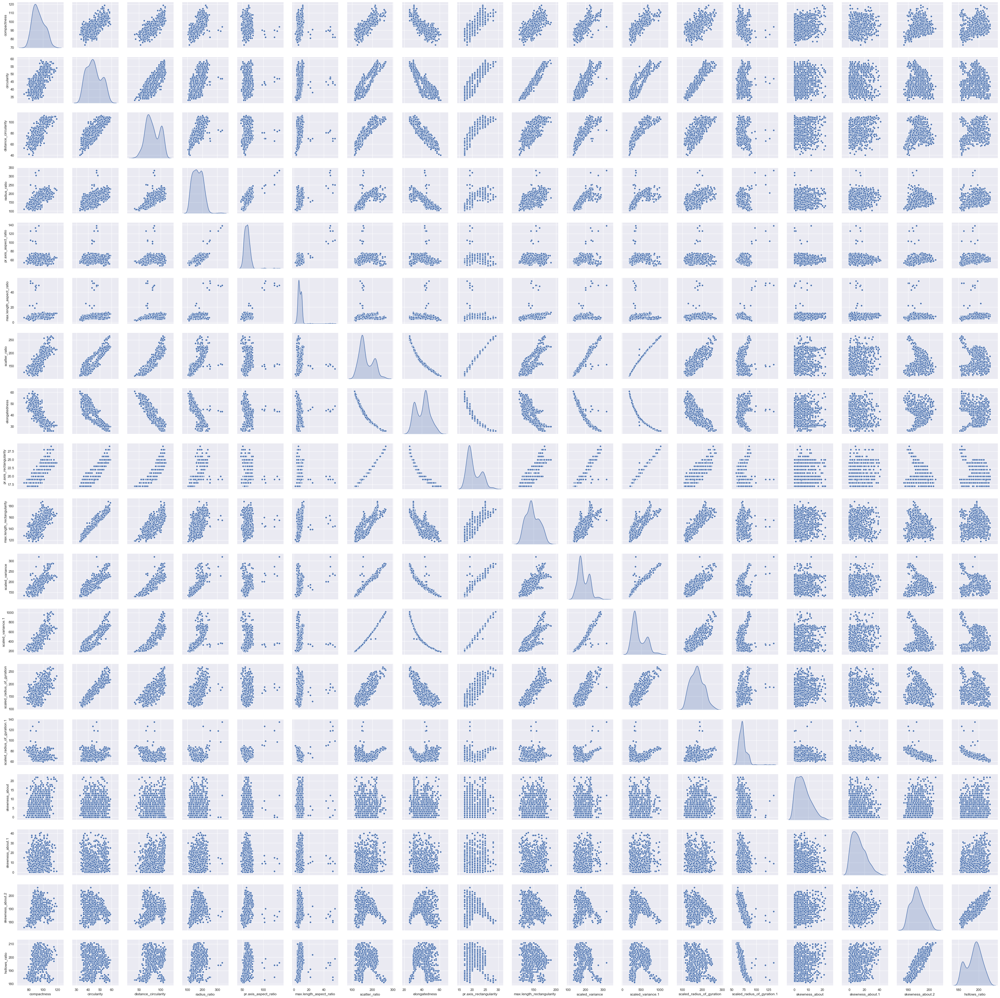

In [23]:
sns.pairplot(impute_knn_df, diag_kind='kde')
plt.show()

<b>Observations:</b>
<ul><li>Method of imputation does not have much impact on the distribution and correlation between features as observed by the 2 pairplots above.
<li>We can observe that features like hollows_ratio, scaled_variance 1 etc. have multiple peaks in their distribution kde graphs that explains the fact that these features might have clusters with different centroid values.
<li>A few of the features are highly correlated and some of the features may contain outliers.
<li>We will be using PCA to reduce number of dimensions and to remove multicollinearity from our datasets or to make our features more orthogonal. After PCA we could expect more cloud-like distributions in our scatter plots depicting the fact that our features are more orthogonal.</ul>

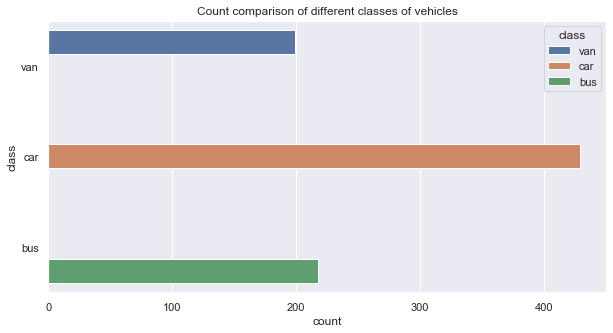

In [24]:
CountPlot(y = 'class',\
          hue = 'class',\
          data = imputed_df,\
          title = "Count comparison of different classes of vehicles")

In [25]:
print("Percentage of vans = {0:.2f}%".format((imputed_df[imputed_df['class'] == 'van'].shape[0]/imputed_df.shape[0])*100))

Percentage of vans = 23.52%


In [26]:
print("Percentage of cars = {0:.2f}%".format((imputed_df[imputed_df['class'] == 'car'].shape[0]/imputed_df.shape[0])*100))

Percentage of cars = 50.71%


In [27]:
print("Percentage of buses = {0:.2f}%".format((imputed_df[imputed_df['class'] == 'bus'].shape[0]/imputed_df.shape[0])*100))

Percentage of buses = 25.77%


<b>Observation:</b> The data here is imbalanced with 51 % of datasets representing 'car'

<b>Detecting Outliers using IQR method 

<ul><li>We will plot boxplot now to observe if our continous features have outliers or not. The boxplot uses IQR method to   detect outliers. Also boxplot would give a visual representation of the five point summary
<li>We will also plot violinplot along with boxplots to compare the distributions as well.

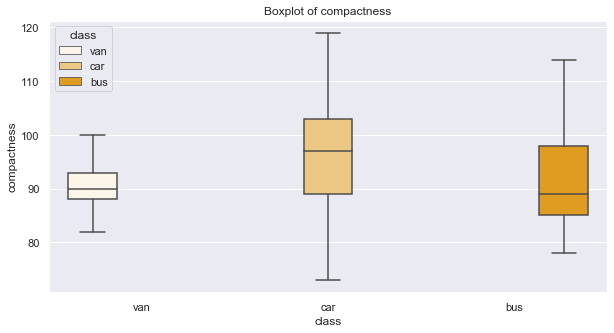

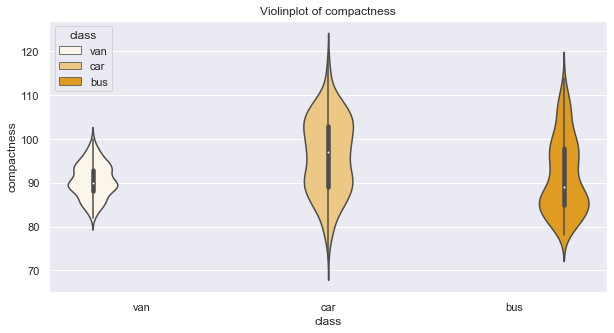

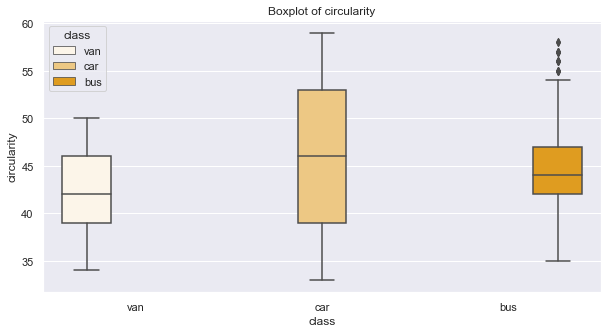

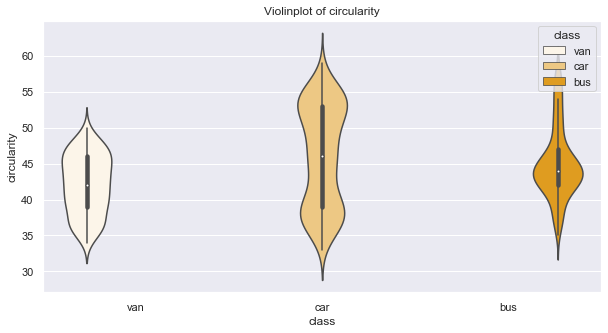

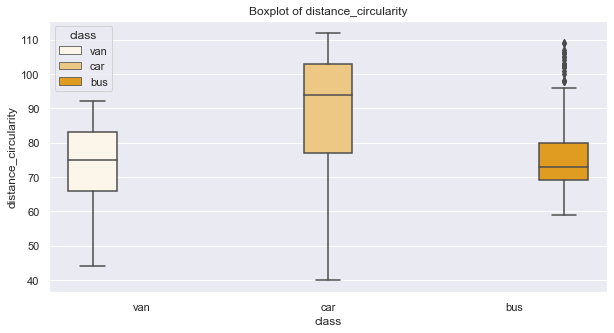

...

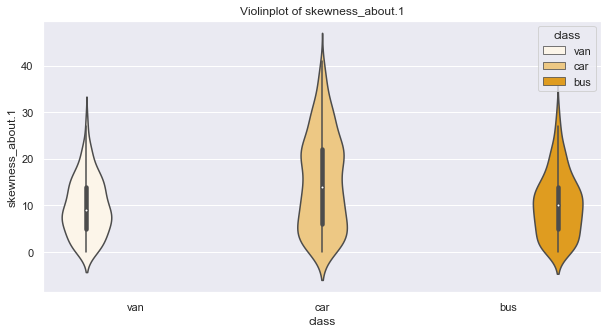

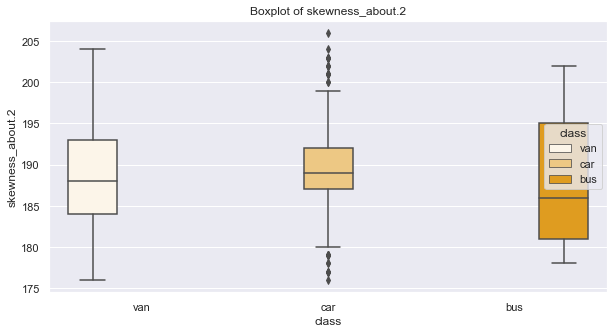

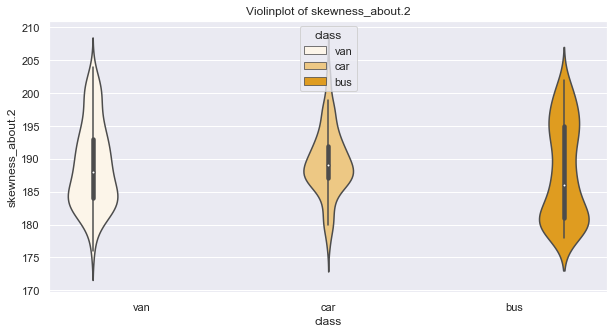

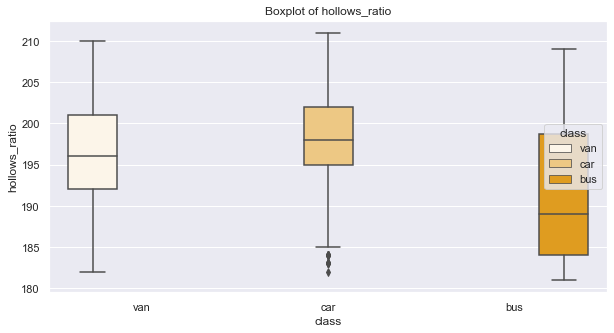

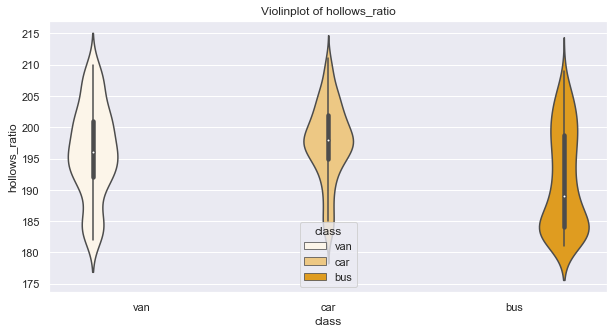

In [28]:
for col in imputed_df.loc[:,imputed_df.dtypes != 'object']:
    BoxPlot(x = 'class',\
            y = col,\
            data = imputed_df,\
            color = 'orange',\
            hue = 'class',\
            title = 'Boxplot of {}'.format(col))

    ViolinPlot(x = 'class',\
            y = col,\
            data = imputed_df,\
            color = 'orange',\
            hue = 'class',\
            title = 'Violinplot of {}'.format(col))

<b>Observation:</b><ul><li>From above we can observer that there are outliers in datasets covering bus mostly.<li>We would try to run a svm model over the dataset without removing outliers and then we would run our model after removing outliers to see if there is a difference</ul>

<b>Detecting correlation

(18.0, 0.0)

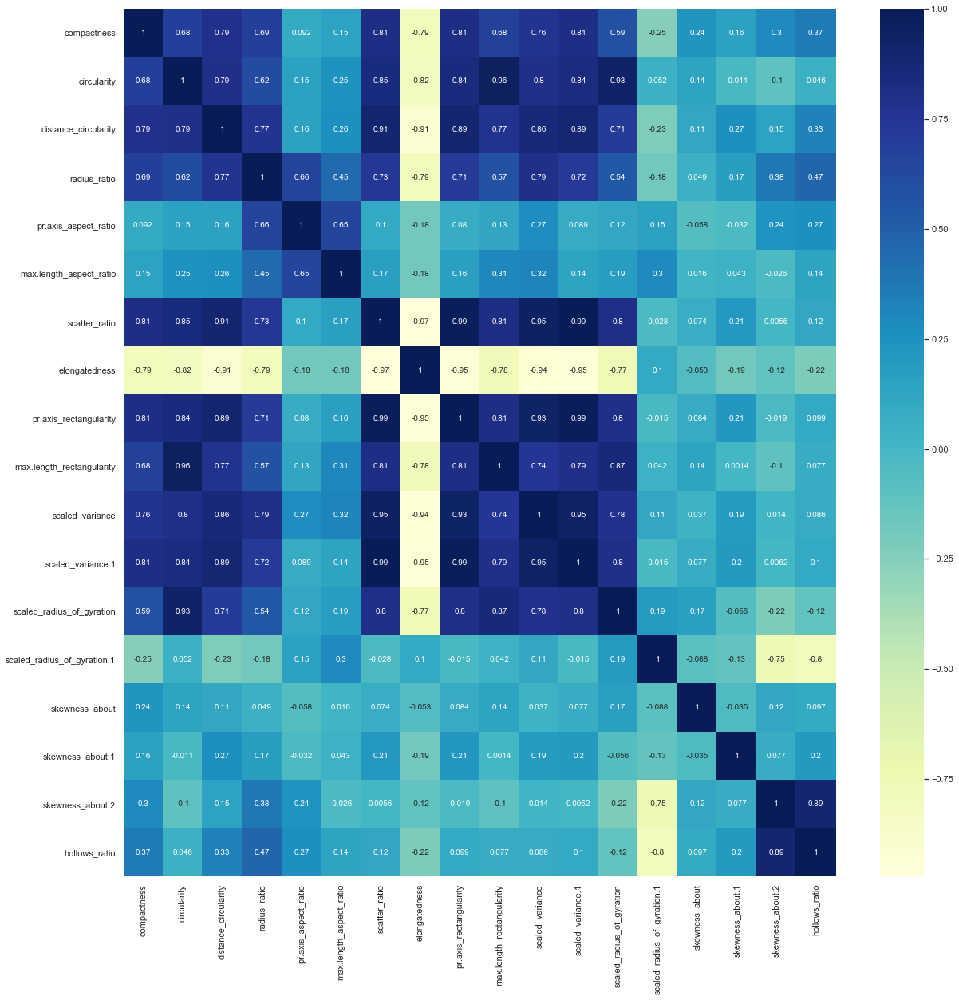

In [158]:
plt.figure(figsize=(20, 20))
imputed_df_corr = imputed_df.corr(method='pearson')
ax = sns.heatmap(imputed_df_corr, annot=True, cmap='YlGnBu')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b>Let's remove highly correlated features . We will use the threshold of 0.80 and -0.80 to remove both positively correlated and negatively correlated features

(18.0, 0.0)

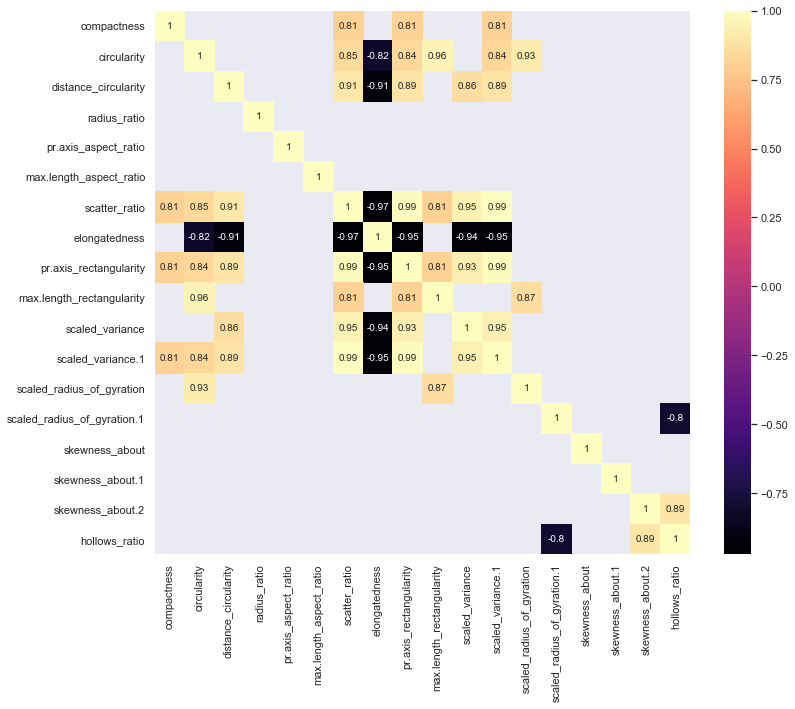

In [159]:
plt.figure(figsize=(12, 10))
imputed_df_corr = imputed_df.corr(method='pearson')
ax = sns.heatmap(imputed_df_corr[(imputed_df_corr >= 0.80) | (imputed_df_corr <= -0.80)], annot=True, cmap='magma')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b>Removing the highly correlated features 

In [160]:
upper_triangle = imputed_df_corr.where(np.triu(np.ones(imputed_df_corr.shape),k=1).astype('bool'))
cols_to_drop = [column for column in upper_triangle.columns \
                if any((upper_triangle[column] >= 0.80) | (upper_triangle[column] <= -0.80))]

In [161]:
print("We will be dropping the below mentioned columns to remove highly correlated features\n")
print(cols_to_drop)

We will be dropping the below mentioned columns to remove highly correlated features

['scatter_ratio', 'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity', 'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration', 'hollows_ratio']


In [162]:
df_wo = imputed_df.drop(columns = cols_to_drop).copy()

<b>Plotting the correlation matrix again

(10.0, 0.0)

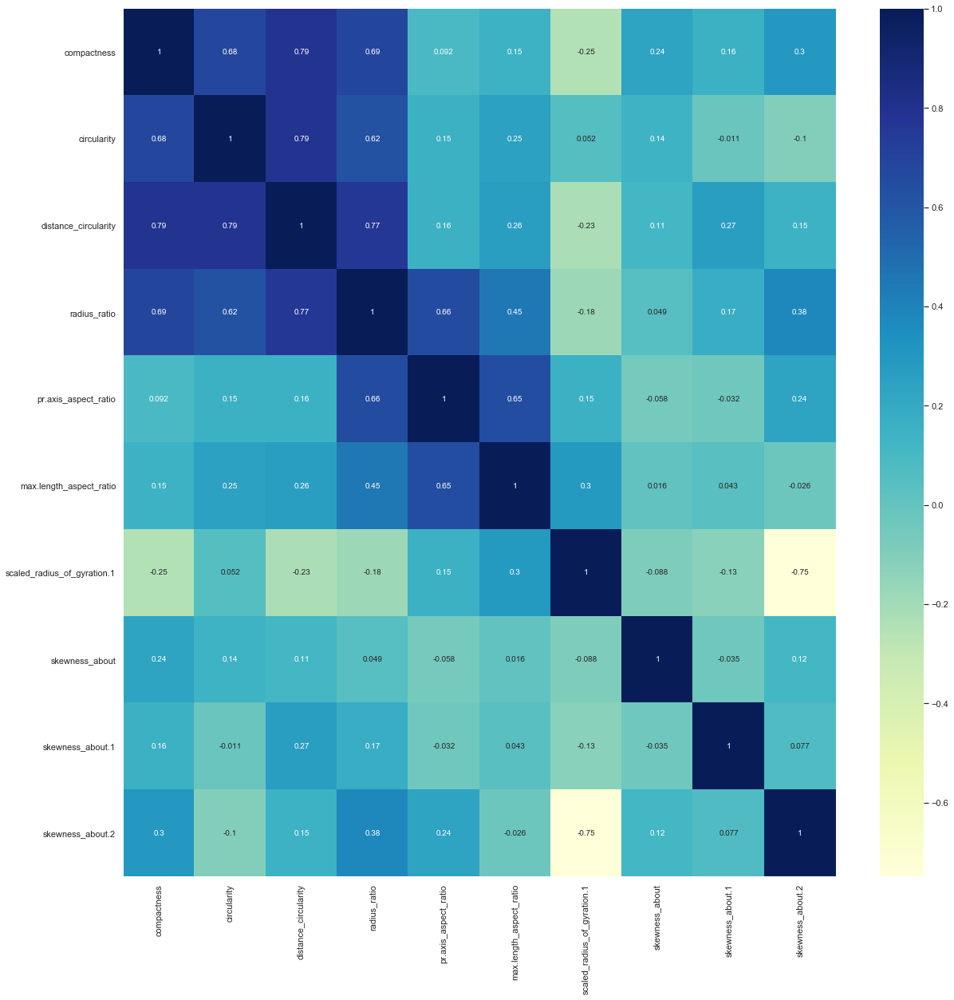

In [163]:
plt.figure(figsize=(20, 20))
imputed_df_corr = df_wo.corr(method='pearson')
ax = sns.heatmap(imputed_df_corr, annot=True, cmap='YlGnBu')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b>Shape of new dataset

In [164]:
df_wo.shape

(846, 11)

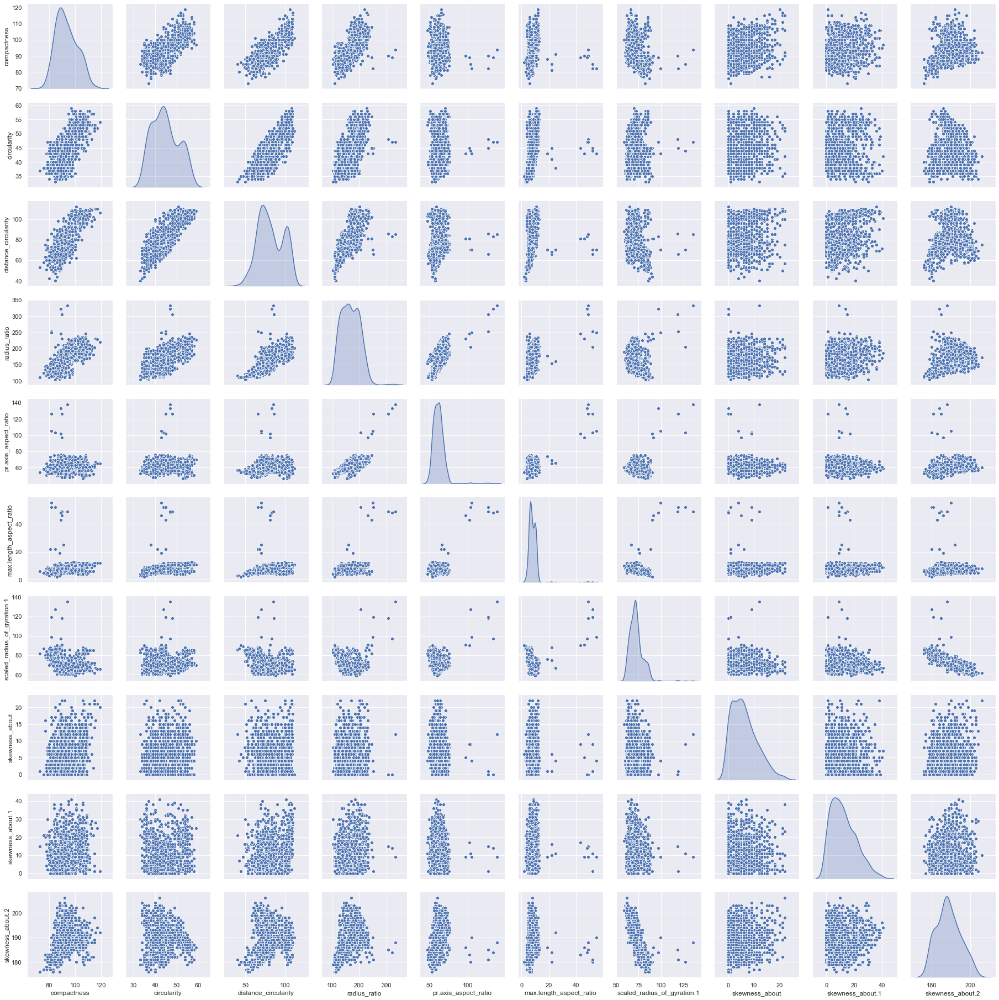

In [165]:
sns.pairplot(df_wo, diag_kind='kde')
plt.show()

<b>Observation:</b>After removing correlated features we can observe that in the above pariplot we can fin very few features that are correlated. Mostly the scatterplots are forming cloud like structures with r value almost 0.

<b>Standardizing the continous features

In [166]:
X = df_wo.copy()
cont_feat = X.loc[:,X.dtypes != 'object'].columns.tolist()
features = X[cont_feat]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)

In [167]:
X[cont_feat] = features

In [168]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,class
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.327326,-0.073812,0.380870,-0.312012,van
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.059384,0.538390,0.156798,0.013265,van
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,0.074587,1.558727,-0.403383,-0.149374,car
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-1.265121,-0.073812,-0.291347,1.639649,van
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,7.309005,0.538390,-0.179311,-1.450481,bus


<b>Building SVM model

<b>Train-Test split(70:30)

In [169]:
y = X['class'] #---->Target Variable
X = X.drop(columns=['class']) #----->Dependent Variables

Encoding target variable

In [170]:
le = preprocessing.LabelEncoder()
le.fit(y)

LabelEncoder()

In [171]:
le.classes_

array(['bus', 'car', 'van'], dtype=object)

In [172]:
y_trans = le.transform(y)

In [173]:
np.unique(y_trans)

array([0, 1, 2])

In [174]:
y_trans

array([2, 2, 1, 2, 0, 0, 0, 2, 2, 1, 2, 1, 0, 2, 0, 1, 2, 0, 1, 1, 0, 2,
       0, 0, 1, 2, 1, 1, 0, 1, 2, 1, 1, 1, 1, 2, 0, 2, 1, 0, 1, 2, 2, 1,
       1, 2, 2, 0, 2, 1, 1, 1, 1, 0, 0, 2, 1, 2, 1, 2, 1, 1, 2, 0, 0, 1,
       0, 1, 2, 0, 1, 1, 1, 1, 2, 1, 1, 1, 0, 0, 0, 0, 2, 1, 0, 0, 2, 2,
       0, 1, 1, 1, 1, 2, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 1, 1, 1, 0, 0,
       2, 2, 1, 1, 2, 2, 1, 1, 0, 0, 1, 2, 2, 1, 2, 2, 0, 0, 2, 0, 1, 1,
       1, 2, 1, 2, 2, 2, 1, 2, 1, 0, 1, 0, 1, 1, 2, 0, 1, 2, 1, 0, 1, 1,
       2, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 1, 0, 2, 0, 2, 0,
       1, 0, 0, 2, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 2, 1, 0, 1, 0, 1, 0,
       0, 0, 2, 1, 1, 1, 2, 2, 1, 0, 0, 1, 1, 2, 0, 0, 1, 1, 1, 1, 0, 2,
       1, 2, 0, 0, 1, 2, 1, 2, 1, 1, 2, 1, 0, 1, 2, 2, 0, 0, 1, 0, 1, 1,
       0, 1, 2, 2, 0, 1, 1, 1, 2, 1, 2, 0, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       1, 0, 0, 1, 2, 2, 0, 1, 2, 2, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 2, 1,
       0, 2, 1, 1, 2, 2, 0, 2, 0, 0, 0, 1, 1, 0, 1,

In [175]:
le.inverse_transform(y_trans)

array(['van', 'van', 'car', 'van', 'bus', 'bus', 'bus', 'van', 'van',
       'car', 'van', 'car', 'bus', 'van', 'bus', 'car', 'van', 'bus',
       'car', 'car', 'bus', 'van', 'bus', 'bus', 'car', 'van', 'car',
       'car', 'bus', 'car', 'van', 'car', 'car', 'car', 'car', 'van',
       'bus', 'van', 'car', 'bus', 'car', 'van', 'van', 'car', 'car',
       'van', 'van', 'bus', 'van', 'car', 'car', 'car', 'car', 'bus',
       'bus', 'van', 'car', 'van', 'car', 'van', 'car', 'car', 'van',
       'bus', 'bus', 'car', 'bus', 'car', 'van', 'bus', 'car', 'car',
       'car', 'car', 'van', 'car', 'car', 'car', 'bus', 'bus', 'bus',
       'bus', 'van', 'car', 'bus', 'bus', 'van', 'van', 'bus', 'car',
       'car', 'car', 'car', 'van', 'bus', 'car', 'car', 'bus', 'car',
       'bus', 'bus', 'van', 'van', 'van', 'bus', 'car', 'car', 'car',
       'bus', 'bus', 'van', 'van', 'car', 'car', 'van', 'van', 'car',
       'car', 'bus', 'bus', 'car', 'van', 'van', 'car', 'van', 'van',
       'bus', 'bus',

In [176]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y_trans,test_size=0.3,random_state=42, stratify=y_trans)

<b>Training the model with GridsearchCV using kfold cross validations

In [177]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}  
  
svm = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, cv=10) 
svm.fit(X_train, y_train) 

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.517, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.517, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.542, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.525, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.508, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.508, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.534, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.767, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.783, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.800, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.763, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.864, total=   0.0s
[CV] 

[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.932, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.831, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.845, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.517, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.500, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] .

[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.517, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.850, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .

[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.797, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.898, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.932, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.914, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.933, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    3.7s finished


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [178]:
print(svm.best_params_)

{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}


In [179]:
print(svm.best_estimator_)

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [180]:
print("Train Score:")
svm.score(X_train,y_train)

Train Score:


0.9662162162162162

In [181]:
svm = SVC(kernel='rbf', C=100, gamma=0.01)
svm.fit(X_train,y_train)
print("Test Score:")
print(svm.score(X_test, y_test))

Test Score:
0.9291338582677166


<b>Confusion Matrix

Text(0.5, 21.5, 'Predicted label')

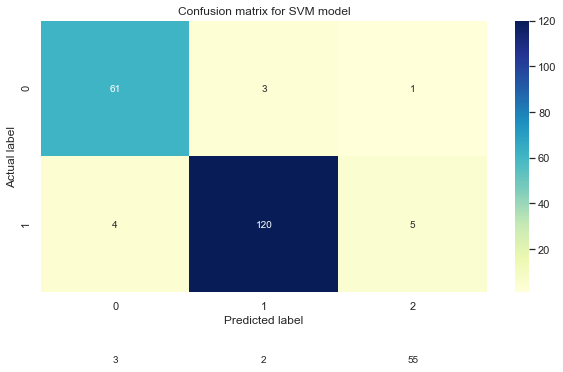

In [182]:
plt.figure(figsize=(10, 5))
y_pred = svm.predict(X_test)
cnf_matrix = confusion_matrix(y_test, y_pred)
p = sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu" ,fmt='g')
bottom, top = ax.get_ylim()
p.set_ylim(2, 0.0)
plt.title('Confusion matrix for SVM model')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [183]:
print(classification_report(y_test,y_pred,target_names = np.unique(le.inverse_transform(y_trans))))

              precision    recall  f1-score   support

         bus       0.90      0.94      0.92        65
         car       0.96      0.93      0.94       129
         van       0.90      0.92      0.91        60

    accuracy                           0.93       254
   macro avg       0.92      0.93      0.92       254
weighted avg       0.93      0.93      0.93       254



Since the classification is multiclass and classes are imbalanced we would also calculate micro average or the overall accuracy

In [184]:
precision_recall_fscore_support(y_test,y_pred,average='micro')

(0.9291338582677166, 0.9291338582677166, 0.9291338582677164, None)

<b>Observation</b><ul><li>The accuracy or micro average score is 93% in the case above and it seems to be a correct metric to measure in case of imbalanced dataset<li>We can say that our model seems to be performing well with SVM algorithm after we did basic data preprocessing like removing correlated features at thresholds of 0.80 and -0.80</ul>

<b>Using p value to find important features

<ul><li>Our null hypothesis is that the selected features or dependent variables do not have any effect on our target or independent variable<li>We will build a naive regression model and will calculate the p values<li>If p value turns out to be higher than our significance level(let's assume 0.05) we will discard the combination of features i.e we will accept our null hypothesis for the given set of features</ul>

In [185]:
le = preprocessing.LabelEncoder()
le.fit(imputed_df.iloc[:,-1:])

LabelEncoder()

In [186]:
x_ols = imputed_df.iloc[:,:-1].values
y_ols = le.transform(imputed_df.iloc[:,-1:])
significance_level = 0.05
selected_columns = imputed_df.columns[:-1]
data, selected_columns = backwardElimination(x_ols, y_ols, significance_level, selected_columns)

In [187]:
data_pval = pd.DataFrame(data = data, columns = selected_columns)

In [188]:
data_pval.shape

(846, 14)

In [189]:
y_ols.shape

(846,)

(14.0, 0.0)

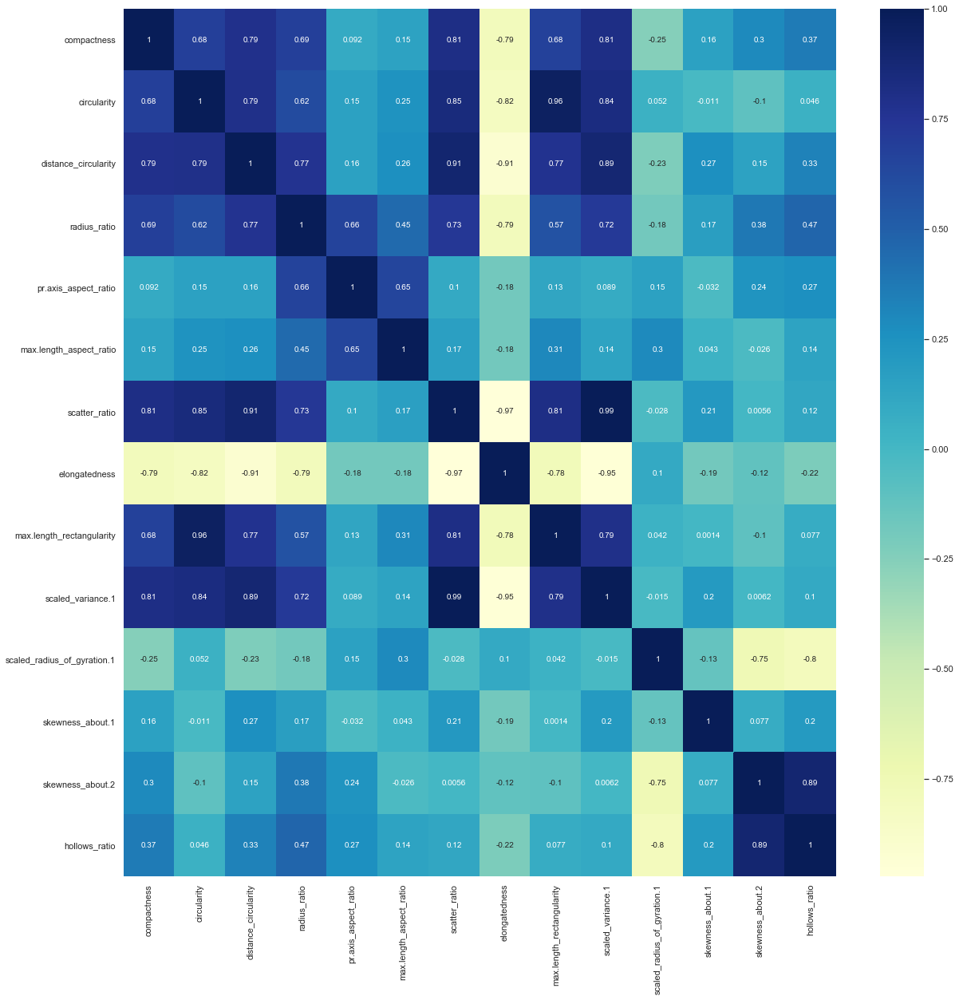

In [190]:
plt.figure(figsize=(20, 20))
df_corr_p = data_pval.corr(method='pearson')
ax = sns.heatmap(df_corr_p, annot=True, cmap='YlGnBu')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b><ul><li>By comparing p values we have got 14 features remaining that have some impact on the target variable.<li>Let us build our model now
</ul>

<b>Standardizing the continous features

In [191]:
X_pval = data_pval.copy()
cont_feat = X_pval.loc[:,X_pval.dtypes != 'object'].columns.tolist()
features = X_pval[cont_feat]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)

In [192]:
X_pval[cont_feat] = features

In [193]:
X_pval.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,max.length_rectangularity,scaled_variance.1,scaled_radius_of_gyration.1,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,0.758332,-0.341934,-0.327326,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.344578,-0.619724,-0.059384,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.689401,1.109379,0.074587,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.344578,-0.738777,-1.265121,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.275646,-0.648070,7.309005,-0.179311,-1.450481,-1.699181


<b>Building SVM model

In [194]:
from sklearn.model_selection import train_test_split
Xp_train,Xp_test,yp_train,yp_test = train_test_split(X_pval,y_ols,test_size=0.3,random_state=42, stratify=y_ols)

<b>Training the model with GridsearchCV using kfold cross validations

In [195]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}  
  
svm = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, cv=10) 
svm.fit(Xp_train, yp_train) 

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.550, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.533, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.517, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.576, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.542, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.525, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.508, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.534, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.883, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.850, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.867, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.814, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.932, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.881, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.949, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.983, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.948, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] .

[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.483, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.492, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.525, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.475, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] .

[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.933, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.847, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.949, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.831, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.898, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.915, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.932, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    3.5s finished


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [196]:
print(svm.best_params_)

{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}


In [197]:
print(svm.best_estimator_)

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [198]:
print("Train Score:")
svm.score(Xp_train,yp_train)

Train Score:


0.9898648648648649

In [199]:
svm = SVC(kernel='rbf', C=100, gamma=0.01)
svm.fit(Xp_train,yp_train)
print("Test Score:")
print(svm.score(Xp_test, yp_test))

Test Score:
0.968503937007874


<b>Confusion Matrix

Text(0.5, 21.5, 'Predicted label')

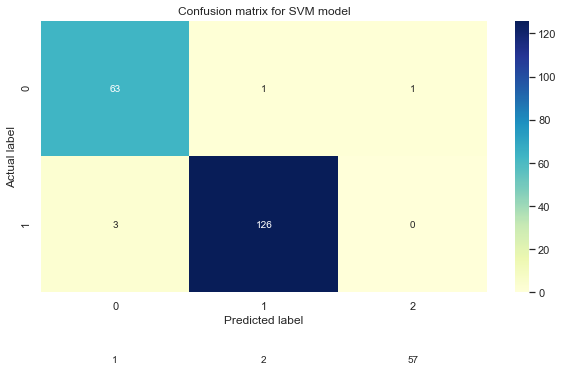

In [200]:
plt.figure(figsize=(10, 5))
y_pred = svm.predict(Xp_test)
cnf_matrix = confusion_matrix(yp_test, y_pred)
p = sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu" ,fmt='g')
bottom, top = ax.get_ylim()
p.set_ylim(2, 0.0)
plt.title('Confusion matrix for SVM model')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [201]:
print(classification_report(yp_test,y_pred,target_names = np.unique(le.inverse_transform(y_ols))))

              precision    recall  f1-score   support

         bus       0.94      0.97      0.95        65
         car       0.98      0.98      0.98       129
         van       0.98      0.95      0.97        60

    accuracy                           0.97       254
   macro avg       0.97      0.97      0.97       254
weighted avg       0.97      0.97      0.97       254



Since the classification is multiclass and classes are imbalanced we would also calculate micro average or the overall accuracy

In [202]:
precision_recall_fscore_support(yp_test,y_pred,average='micro')

(0.968503937007874, 0.968503937007874, 0.968503937007874, None)

<b>Observation</b><ul><li>The accuracy or micro average score is 97% in the case above and it seems to be a correct metric to measure in case of imbalanced dataset<li>We can say that our model seems to be performing well with SVM algorithm after we reduced dimensions based on p value instead of simply removing correlated features above and below the thresholds of 0.80 and -0.80 respectively</ul>

<b>Now we will do PCA to reduce multicollinearity and try to reduce the number of dimensions in our dataset

Plotting correlation matrix again for the original imputed data

(18.0, 0.0)

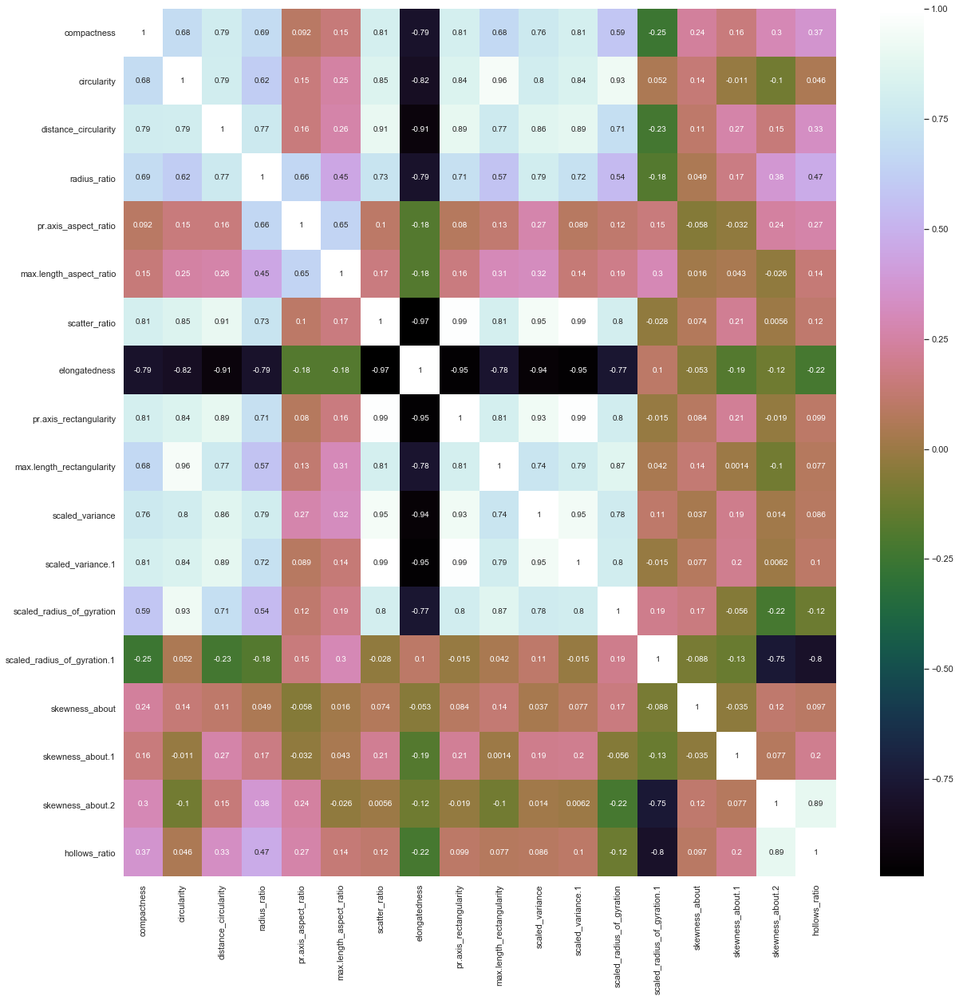

In [203]:
plt.figure(figsize=(20, 20))
imputed_df_corr = imputed_df.corr(method='pearson')
ax = sns.heatmap(imputed_df_corr, annot=True, cmap='cubehelix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b>Standardizing the continous features

In [204]:
X1 = imputed_df.copy()
cont_feat = X1.loc[:,X1.dtypes != 'object'].columns.tolist()
features = X1[cont_feat]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)

In [205]:
X1[cont_feat] = features

In [206]:
X1.shape

(846, 19)

In [207]:
X1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957,van
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977,van
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447,car
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056,van
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181,bus


In [208]:
y1 = X1['class'] #---->Target Variable
X1 = X1.drop(columns=['class']) #----->Dependent Variables
le = preprocessing.LabelEncoder()
le.fit(y1)
y1_trans = le.transform(y1)
np.unique(y1_trans)

array([0, 1, 2])

<b>Covariance Matrix

For covariance matrix we should standardize our columns

In [209]:
cov_mat = np.cov(X1.T)
cov_mat

array([[ 1.00118343,  0.68569786,  0.79086299,  0.69055952,  0.09164265,
         0.14842463,  0.81358214, -0.78968322,  0.81465658,  0.67694334,
         0.76297234,  0.81497566,  0.58593517, -0.24988794,  0.23635777,
         0.15720044,  0.29889034,  0.36598446],
       [ 0.68569786,  1.00118343,  0.79325751,  0.6216467 ,  0.15396023,
         0.25176438,  0.8489411 , -0.82244387,  0.84439802,  0.96245572,
         0.79724837,  0.83693508,  0.92691166,  0.05200785,  0.14436828,
        -0.01145212, -0.10455005,  0.04640562],
       [ 0.79086299,  0.79325751,  1.00118343,  0.76794246,  0.15864319,
         0.26499957,  0.90614687, -0.9123854 ,  0.89408198,  0.77544391,
         0.86253904,  0.88706577,  0.70660663, -0.22621115,  0.1140589 ,
         0.26586088,  0.14627113,  0.33312625],
       [ 0.69055952,  0.6216467 ,  0.76794246,  1.00118343,  0.66423242,
         0.45058426,  0.73529816, -0.79041561,  0.70922371,  0.56962256,
         0.79435372,  0.71928618,  0.53700678, -0.180

<b>Plotting covariance

(18.0, 0.0)

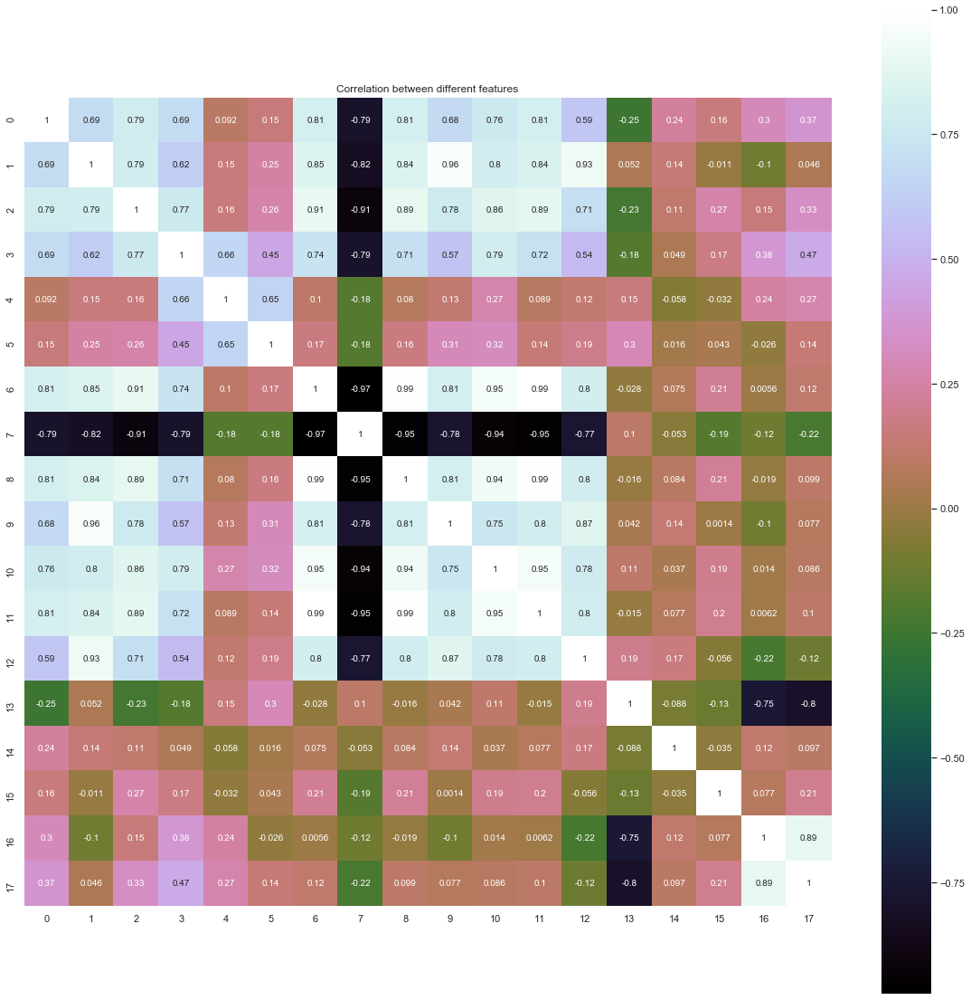

In [210]:
plt.figure(figsize=(20, 20))
ax = sns.heatmap(cov_mat, vmax=1, square=True,annot=True,cmap='cubehelix')
plt.title('Correlation between different features')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<b>Using PCA from scikit learn

Text(0, 0.5, 'Cumulative explained variance')

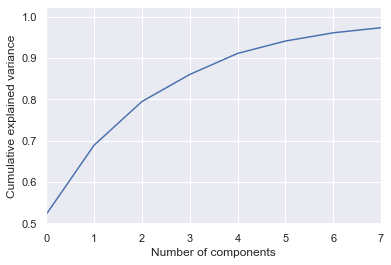

In [211]:
pca = PCA().fit(X1)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,7,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [212]:
np.cumsum(pca.explained_variance_ratio_)

array([0.52186034, 0.68915802, 0.79478441, 0.86025901, 0.9111577 ,
       0.94112183, 0.96103549, 0.97335049, 0.98226265, 0.98735979,
       0.99104984, 0.9936357 , 0.99562195, 0.99714304, 0.99828498,
       0.99927917, 0.9998355 , 1.        ])

<b>Observation:</b> From above graph we can observe around 5 principal components capture about 95% of the variance in the data. Hence we can drop components 6 and 7

In [213]:
sklearn_pca = PCA(n_components=5)
X_sklearn = sklearn_pca.fit_transform(X1)

In [214]:
X_sklearn

array([[ 3.34162030e-01, -2.19026358e-01,  1.00158417e+00,
         1.76612373e-01,  7.93007340e-02],
       [-1.59171085e+00, -4.20602982e-01, -3.69033854e-01,
         2.33234119e-01,  6.93948596e-01],
       [ 3.76932418e+00,  1.95282752e-01,  8.78587407e-02,
         1.20221219e+00,  7.31732287e-01],
       ...,
       [ 4.80917387e+00, -1.24931048e-03,  5.32333105e-01,
         2.95652326e-01, -1.34423634e+00],
       [-3.29409242e+00, -1.00827615e+00, -3.57003198e-01,
        -1.93367515e+00,  4.27679849e-02],
       [-4.76505347e+00,  3.34899728e-01, -5.68136078e-01,
        -1.22480708e+00, -5.40510449e-02]])

In [215]:
X_sklearn.shape

(846, 5)

<b>Plotting pairplot between principal components to visualize correlation

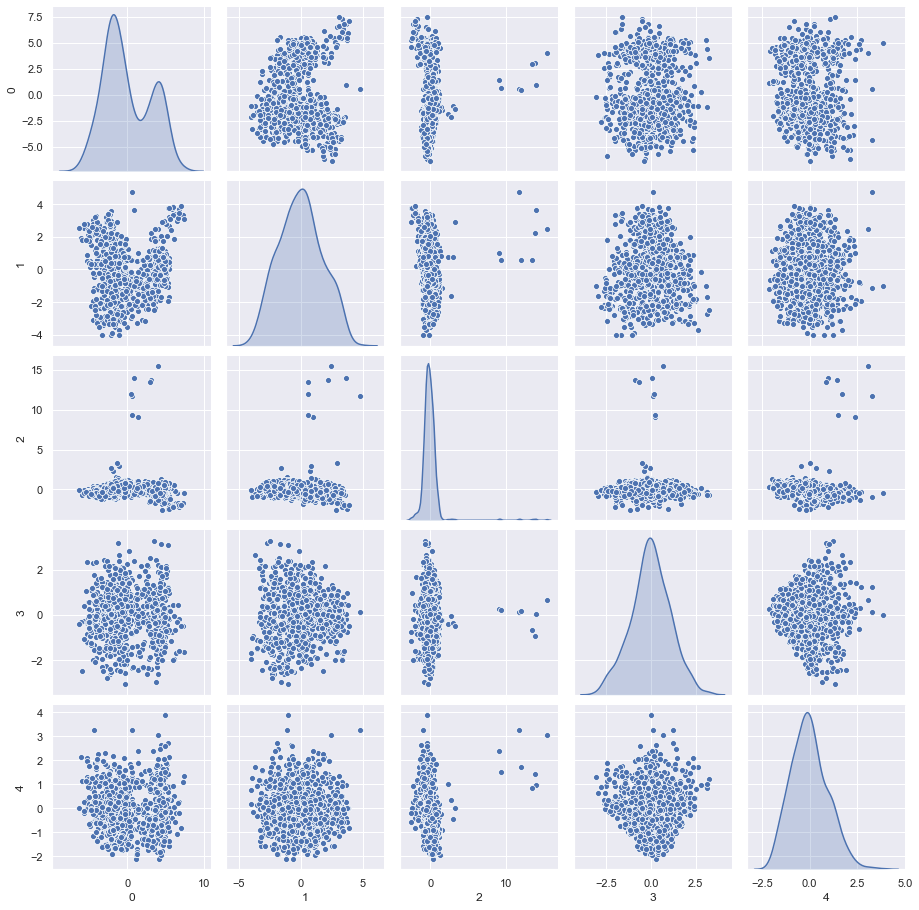

In [216]:
sns.pairplot(pd.DataFrame(X_sklearn), diag_kind='kde')
plt.show()

<b>Observation:</b> From above we can clearly see that our features do not show much correlation and are mostly normally distributed

In [217]:
#----keeping the random state same so that the same rows get picked up for test cases as in case of our last model training with normal features-----#
from sklearn.model_selection import train_test_split
X1_train,X1_test,y1_train,y1_test = train_test_split(X_sklearn,y1_trans,test_size=0.3,random_state=42, stratify=y1_trans)

In [218]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}  
  
svm_pca = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, cv=10) 
svm_pca.fit(X1_train, y1_train) 

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.550, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.567, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.533, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.576, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.576, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.525, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.633, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.700, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.661, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.763, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.661, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.661, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.695, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.644, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.741, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.517, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.517, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.483, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] ........ C=1, gamma=0.001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=1, gamma=0.001, kernel=rbf ....................................
[CV] .

[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.508, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.475, total=   0.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=10, gamma=0.0001, kernel=rbf, score=0.517, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.717, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.700, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.750, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.729, total=   0.0s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .

[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.729, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.831, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.864, total=   0.0s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.793, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.683, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.733, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.700, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:    3.4s finished


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [219]:
print(svm_pca.best_params_)

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [220]:
print(svm_pca.best_estimator_)

SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.1, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [221]:
print("Train Score:")
svm_pca.score(X1_train,y1_train)

Train Score:


0.8851351351351351

In [222]:
svm = SVC(kernel='rbf', C=100, gamma=0.01)
svm.fit(X_train,y_train)
print("Test Score:")
print(svm_pca.score(X1_test, y1_test))

Test Score:
0.8385826771653543


<b>Confusion Matrix

Text(0.5, 21.5, 'Predicted label')

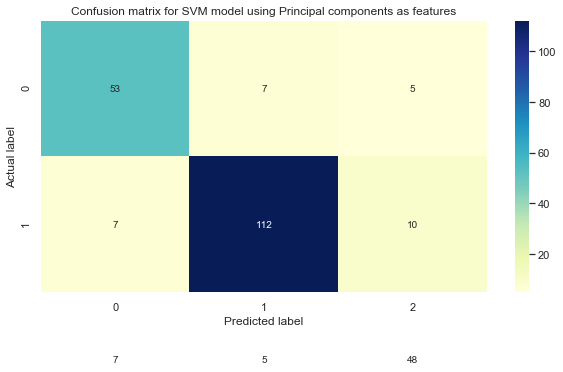

In [223]:
plt.figure(figsize=(10, 5))
y1_pred = svm_pca.predict(X1_test)
cnf_matrix = confusion_matrix(y1_test, y1_pred)
p = sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu" ,fmt='g')
bottom, top = ax.get_ylim()
p.set_ylim(2, 0.0)
plt.title('Confusion matrix for SVM model using Principal components as features')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [224]:
print(classification_report(y1_test,y1_pred,target_names = np.unique(le.inverse_transform(y1_trans))))

              precision    recall  f1-score   support

         bus       0.79      0.82      0.80        65
         car       0.90      0.87      0.89       129
         van       0.76      0.80      0.78        60

    accuracy                           0.84       254
   macro avg       0.82      0.83      0.82       254
weighted avg       0.84      0.84      0.84       254



Since the classification is multiclass and classes are imbalanced we would also calculate micro average or the overall accuracy

In [225]:
precision_recall_fscore_support(y1_test,y1_pred,average='micro')

(0.8385826771653543, 0.8385826771653543, 0.8385826771653543, None)

<b>Final Conclusion

In [229]:
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Algorithm", "Dimensionality Reduction technique","Best train micro average F1 score","Best test micro average F1 score"]

x.add_row(["SVM","Pearson correlation","0.97","0.93"])
x.add_row(["SVM","Hypothesis testing(p value)","0.99","0.97"])
x.add_row(["SVM","PCA","0.88","0.84"])
print(x)

+-----------+------------------------------------+-----------------------------------+----------------------------------+
| Algorithm | Dimensionality Reduction technique | Best train micro average F1 score | Best test micro average F1 score |
+-----------+------------------------------------+-----------------------------------+----------------------------------+
|    SVM    |        Pearson correlation         |                0.97               |               0.93               |
|    SVM    |    Hypothesis testing(p value)     |                0.99               |               0.97               |
|    SVM    |                PCA                 |                0.88               |               0.84               |
+-----------+------------------------------------+-----------------------------------+----------------------------------+


<ul><li>The test accuracy or test micro average score after PCA is 84% and it seems to be a correct metric to measure in case of imbalanced dataset<li>We can say that our model does not seem to be performing as well as it performed when we used original features and used p value method for dimensionality reduction.<li>Hence we can conclude that introducing principal components as the feature does not seem to improve the model performance.</ul>